# Cognifyz Data Analyst Internship

# Level 2

## Task 1 : Restaurant Ratings

#### Analyze the distribution of aggregate ratings and determine the most common rating range.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv(r"C:\Users\Suraj Jagtap\Desktop\Dataset  (1).csv")
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Distribution of restaurants by rating range:
Rating Range
0-1    2148
1-2       3
2-3    1430
3-4    4590
4-5    1380
Name: count, dtype: int64


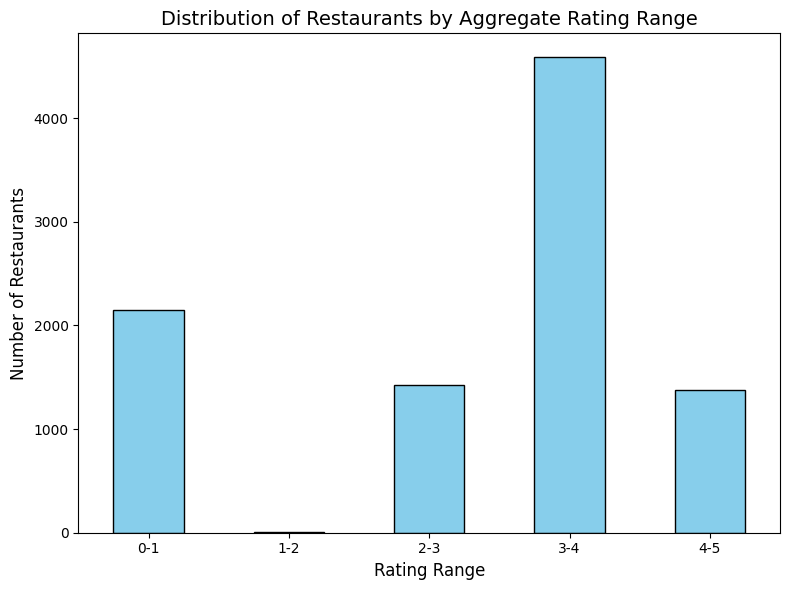

In [2]:
# Step 1: Define rating ranges
rating_bins = [0, 1, 2, 3, 4, 5]  
rating_labels = ['0-1', '1-2', '2-3', '3-4', '4-5']

# Step 2: Categorize the ratings into ranges
df['Rating Range'] = pd.cut(df['Aggregate rating'], bins=rating_bins, labels=rating_labels, right=False)

# Step 3: Count the number of restaurants in each rating range
rating_range_counts = df['Rating Range'].value_counts().sort_index()

# Step 4: Output the result
print("Distribution of restaurants by rating range:")
print(rating_range_counts)

# Step 5: Plot the bar chart
plt.figure(figsize=(8, 6))
rating_range_counts.plot(kind='bar', color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel("Rating Range", fontsize=12)
plt.ylabel("Number of Restaurants", fontsize=12)
plt.title("Distribution of Restaurants by Aggregate Rating Range", fontsize=14)
plt.xticks(rotation=0)  # Keep x-axis labels horizontal

# Show the plot
plt.tight_layout()
plt.show()


#### Calculate the average number of votes received by restaurants

In [3]:
# Calculate the average number of votes
average_votes = df['Votes'].mean()

# Output the result
print(f"The average number of votes received by restaurants is: {average_votes:.2f}")


The average number of votes received by restaurants is: 156.91


## Task 2 Cuisine Combination

#### Identify the most common combinations of cuisines in the dataset.

In [4]:
from itertools import combinations
from collections import Counter

# Step 1: Drop rows with NaN values in 'Cuisines' and ensure all cuisines are strings
df = df.dropna(subset=['Cuisines'])  
df['Cuisines'] = df['Cuisines'].astype(str)  

# Step 2: Split the 'Cuisines' column into lists of individual cuisines
df['Cuisines'] = df['Cuisines'].str.split(', ')

# Step 3: Create a list to store all possible combinations of cuisines for each restaurant
all_combinations = []

# Step 4: Generate all possible combinations of cuisines for each restaurant
for cuisine_list in df['Cuisines']:

    if isinstance(cuisine_list, list) and len(cuisine_list) > 1:
        for r in range(2, len(cuisine_list) + 1):  
            all_combinations.extend(combinations(cuisine_list, r))

# Step 5: Count the frequency of each combination
combination_count = Counter(all_combinations)

# Step 6: Get the most common combinations 
top_combinations = combination_count.most_common(30)

# Step 7: Output the most common combinations
print("Most common combinations of cuisines:")
for combo, count in top_combinations:
    print(f"{', '.join(combo)}: {count}")


Most common combinations of cuisines:
North Indian, Chinese: 1516
North Indian, Mughlai: 728
North Indian, Fast Food: 377
Chinese, Fast Food: 331
North Indian, South Indian: 314
North Indian, Continental: 288
Chinese, North Indian: 268
Bakery, Desserts: 263
Mughlai, Chinese: 258
South Indian, Chinese: 239
North Indian, Mughlai, Chinese: 228
Bakery, Fast Food: 201
North Indian, Italian: 199
Continental, North Indian: 180
Pizza, Fast Food: 173
Continental, Italian: 171
Chinese, Continental: 163
Chinese, Thai: 161
North Indian, Chinese, Fast Food: 156
Mithai, Street Food: 156
Continental, Chinese: 140
Fast Food, Chinese: 135
North Indian, Street Food: 131
Cafe, Italian: 129
North Indian, South Indian, Chinese: 127
Chinese, Italian: 125
Chinese, Mughlai: 121
North Indian, Chinese, Continental: 117
Desserts, Fast Food: 114
Fast Food, North Indian: 108


#### Determine if certain cuisine combinations tend to have higher ratings.

In [5]:
import pandas as pd
from itertools import combinations

# Assuming df is your DataFrame

# Step 1: Clean data - Drop NaN values in 'Cuisines' and ensure cuisines are in list format
df = df.dropna(subset=['Cuisines'])  
df['Cuisines'] = df['Cuisines'].astype(str)  
df['Cuisines'] = df['Cuisines'].str.split(', ')  

# Step 2: Generate combinations of cuisines (for combinations of size 2 and above)
df['Cuisine Combinations'] = df['Cuisines'].apply(lambda x: [' & '.join(combo) for combo in combinations(sorted(x), 2)])

# Step 3: Flatten the list of combinations for each restaurant
combination_data = df.explode('Cuisine Combinations')

# Step 4: Group by cuisine combinations and calculate average ratings
avg_rating_by_combo = combination_data.groupby('Cuisine Combinations')['Aggregate rating'].mean().reset_index()

# Step 5: Sort combinations by average rating to find which tend to have higher ratings
avg_rating_by_combo_sorted = avg_rating_by_combo.sort_values(by='Aggregate rating', ascending=False)

# Step 6: Output the result
print("Cuisine combinations with higher average ratings:")
print(avg_rating_by_combo_sorted.head(30))


Cuisine combinations with higher average ratings:
                   Cuisine Combinations  Aggregate rating
751           'Caribbean' & ['American'          4.900000
384               'Bar Food' & 'Steak']          4.900000
290                 'BBQ' & 'Sandwich']          4.900000
1608           'Indonesian'] & ['Sunda'          4.900000
2262                'Sandwich' & 'Tea']          4.900000
561                'Breakfast' & ['BBQ'          4.900000
557           'Breakfast' & 'Southern']          4.900000
1576            'Indian'] & ['European'          4.900000
945     'Coffee and Tea'] & ['American'          4.900000
1527       'Healthy Food'] & ['Mexican'          4.900000
2330           'Seafood'] & ['Hawaiian'          4.900000
1860           'Lucknowi'] & ['Mughlai'          4.900000
1080               'Deli'] & ['Italian'          4.900000
2509               'Tea'] & ['American'          4.900000
1417            'German'] & ['European'          4.900000
1972           'Mexica

# Task 3 : Geographic Analysis

#### Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [6]:
import folium

# Step 1: Create a base map centered around the average latitude and longitude of all restaurants
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Step 2: Add markers for each restaurant
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
        icon=folium.Icon(color='blue', icon='cutlery', prefix='fa')
    ).add_to(restaurant_map)

restaurant_map


#### Identify any patterns or clusters of restaurants in specific areas.

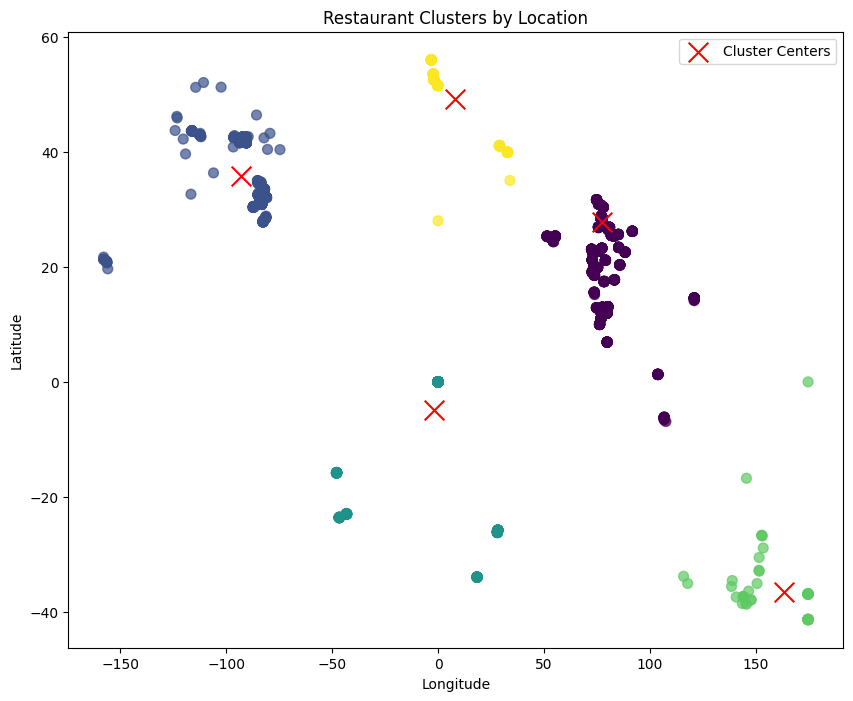

In [7]:

from sklearn.cluster import KMeans

# Step 1: Extract the latitude and longitude columns for clustering
coordinates = df[['Latitude', 'Longitude']]

# Step 2: Perform K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  
df['Cluster'] = kmeans.fit_predict(coordinates)

# Step 3: Plot the clusters on a map
plt.figure(figsize=(10, 8))
plt.scatter(df['Longitude'], df['Latitude'], c=df['Cluster'], cmap='viridis', s=50, alpha=0.7)

# Plot the cluster centers
plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], c='red', marker='x', s=200, label="Cluster Centers")

# Set plot title and labels
plt.title('Restaurant Clusters by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()

# Display the plot
plt.show()


# Task 4 : Restaurant Chains

#### Identify if there are any restaurant chains present in the dataset.

In [8]:

# Step 1: Group by 'Restaurant Name' and count occurrences
restaurant_counts = df['Restaurant Name'].value_counts()

# Step 2: Filter restaurant names that appear more than once (likely chains)
restaurant_chains = restaurant_counts[restaurant_counts > 1]

# Step 3: Display the potential restaurant chains
print("Potential Restaurant Chains (Appears more than once):")
print(restaurant_chains)

# Optional: Display the rows for the identified chains
chains_data = df[df['Restaurant Name'].isin(restaurant_chains.index)]




Potential Restaurant Chains (Appears more than once):
Restaurant Name
Cafe Coffee Day                   83
Domino's Pizza                    79
Subway                            63
Green Chick Chop                  51
McDonald's                        48
                                  ..
Zaika Kathi Rolls                  2
The Night Owl                      2
The Cheesecake Factory             2
New Kadimi                         2
Ceviche Tapas Bar & Restaurant     2
Name: count, Length: 734, dtype: int64


#### Analyze the ratings and popularity of different restaurant chains.

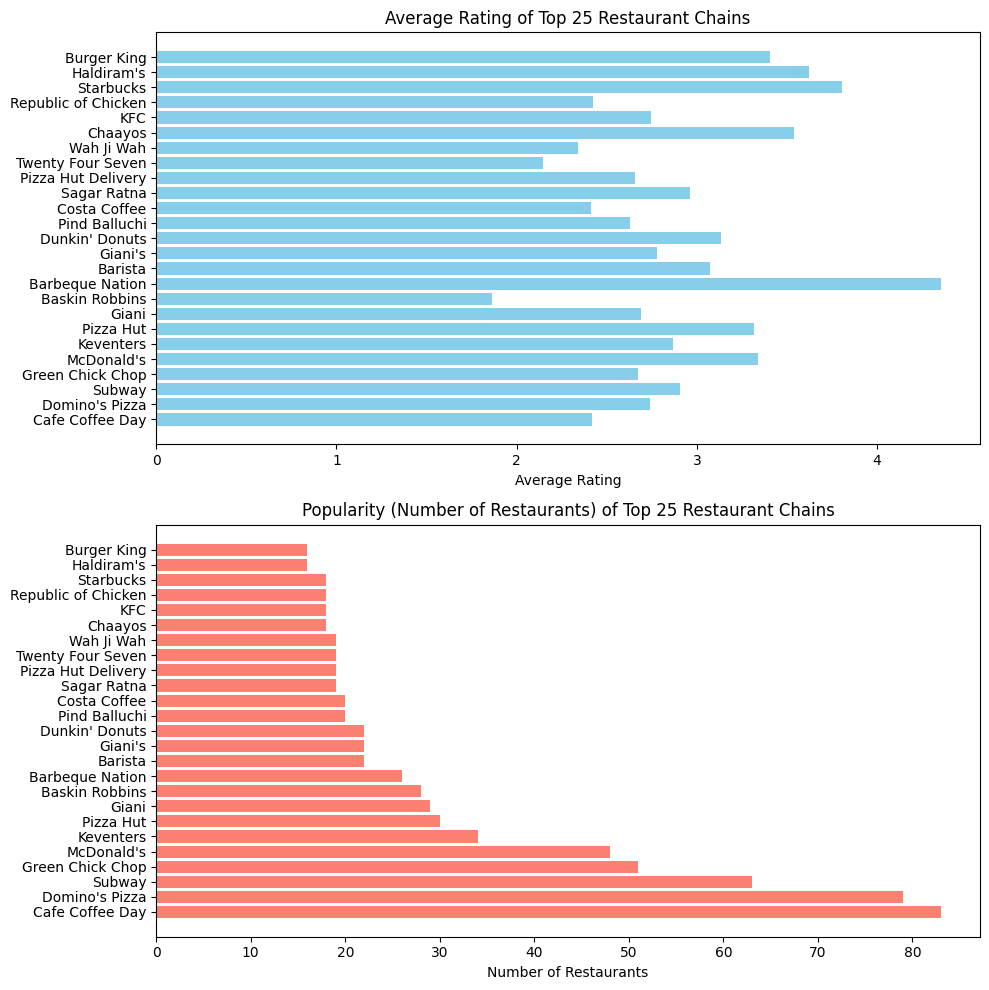

In [9]:


# Step 1: Group by 'Restaurant Name' and calculate the average rating and the number of restaurants
restaurant_stats = df.groupby('Restaurant Name').agg(
    avg_rating=('Aggregate rating', 'mean'),
    num_restaurants=('Restaurant ID', 'count')
).reset_index()

# Step 2: Sort by the number of restaurants (popularity) and average rating
restaurant_stats_sorted_by_popularity = restaurant_stats.sort_values(by='num_restaurants', ascending=False)

# Step 3: Filter the top 10 restaurant chains by popularity 
top_25_chains_by_popularity = restaurant_stats_sorted_by_popularity.head(25)

# Step 4: Plot the results
fig, ax = plt.subplots(2, 1, figsize=(10, 10))

# Plot 1: Average rating for top 10 restaurant chains
ax[0].barh(top_25_chains_by_popularity['Restaurant Name'], top_25_chains_by_popularity['avg_rating'], color='skyblue')
ax[0].set_xlabel('Average Rating')
ax[0].set_title('Average Rating of Top 25 Restaurant Chains')

# Plot 2: Number of restaurants for top 10 restaurant chains
ax[1].barh(top_25_chains_by_popularity['Restaurant Name'], top_25_chains_by_popularity['num_restaurants'], color='salmon')
ax[1].set_xlabel('Number of Restaurants')
ax[1].set_title('Popularity (Number of Restaurants) of Top 25 Restaurant Chains')

# Display the plots
plt.tight_layout()
plt.show()
